# Solar and Wind Energy Prediction

In [8]:
!pip install seaborn
!pip install statsmodels

In [9]:
# Import packages needed for the project

import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.dates import DateFormatter
import datetime as dt
from statsmodels.tsa.stattools import adfuller
import plotly.offline as pyoff
import plotly.graph_objs as go
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

# matplotlib style & parameter changes
import matplotlib
matplotlib.style.use('seaborn-darkgrid')
matplotlib.rcParams['figure.figsize'] = (16, 7)

ModuleNotFoundError: No module named 'plotly'

# Read the Data & Cleaning

In [ ]:
# Bring in all the data for 2015- 2021 Germany. DE is the two letter symbol for germany.
energy_all = pd.read_csv("time_series_60min_singleindex_filtered (3).csv",
                        parse_dates=[0], index_col=0)

In [10]:
# check out the infor of the data frame
energy_all.info()

NameError: name 'energy_all' is not defined

There is 50401 total rows. The data type for the two generation columns are both float64 which is good. Need to get rid of the `cet_cest_timestamp` column

In [ ]:
# count the number of nulls in the data set
energy_all.isna().sum()

This appears to not be that many null values however it is not a good idea to delete them because that will mess with the time series.

In [ ]:
# lets look at 2 days of energy
energy_all.head(48)

This shows us that 7 data points for solar power is NaN and that we have a lot of zeros. From my previous work, having zeros makes it very hard to transform the data when it comes to modeling. You cannot take the log of zero. The zeros are because there is no sun at night and in the early morning.

In [ ]:
# Lets see where the nulls are for solar.
energy_all[energy_all['DE_solar_generation_actual'].isna()]

In [ ]:
# where are the wind nulls.
energy_all[energy_all['DE_wind_generation_actual'].isna()]

The wind nul values appear to also be where the solar null values are. These null values are not that significant because there is not that many. I need to fill them with a value so I will fill it with the day before. It is such a low percentage of my data and I will be averaging over a full day's worth of data so it should not effect my results. Anything is better than filling the values in with zero because that will mess with the the predictions.

In [ ]:
# use the shift function to shift the index 24 hours(this code causes some errors trying to fill both
# so I will use the 'cet_cest_timestamp' as a dummy column to get the NaN's filled the way I want

nulls = energy_all.isna().any(axis=1)
energy_all.loc[nulls, ['DE_solar_generation_actual','cet_cest_timestamp']] = energy_all.shift(24).loc[nulls, ['DE_solar_generation_actual','cet_cest_timestamp']]

In [ ]:
# lets see the null values now
energy_all[energy_all['DE_solar_generation_actual'].isna()]

The only remaining null values left are the ones that were from the first day because we filled in the rest of the null values from the day before. We see that it that it also turned the dummy column, `cet_cest_timestamp`, into nulls at the same location. This is why I used it as dummy column. 

In [ ]:
energy_all.isna().sum()

In [ ]:
# fill in the rest to zero because that is what they would be at those hours of night till 6 am
energy_all['DE_solar_generation_actual'].fillna(0, inplace = True)
energy_all['cet_cest_timestamp'].fillna(0, inplace = True)

In [ ]:
energy_all.isna().sum()

In [ ]:
# repeat process for wind energy
nulls = energy_all.isna().any(axis=1)
energy_all.loc[nulls, ['DE_wind_generation_actual','cet_cest_timestamp']] = energy_all.shift(24).loc[nulls, ['DE_wind_generation_actual','cet_cest_timestamp']]

In [ ]:
energy_all.isna().sum()

Only one null value left which is expected 

In [ ]:
# lets see where that last null value is 
energy_all[energy_all['DE_wind_generation_actual'].isna()]

In [ ]:
# this seems like a logical estimate considering how the wind is going that day(shouldn't really matter)
energy_all['DE_wind_generation_actual'].fillna(8000, inplace=True)

In [ ]:
# Drop the column becasue we do not need another time column
energy_all.drop(columns='cet_cest_timestamp',inplace=True)

In [ ]:
#
energy_all.info()

In [ ]:
energy_all.head(5)

## EDA on original Data Frame

In [ ]:
# I am going to create a new data frame so I can make the appropriate boxplots. 
DE_energy = energy_all.reset_index()
DE_energy.info()

In [ ]:
# create utc_timestamp as a column and another hour column
DE_energy['utc_timestamp'] = pd.to_datetime(DE_energy['utc_timestamp']).apply(lambda x: dt.datetime.strftime(x,'%Y-%m-%d %H:%M:%S'))

DE_energy['utc_timestamp']=pd.to_datetime(DE_energy['utc_timestamp'])
DE_energy['hour'] = DE_energy['utc_timestamp'].dt.hour


In [ ]:
DE_energy.info()

In [ ]:
# Create a boxplot of the average solar generation production 
plt.figure(figsize=(10,5))
sns.boxplot(DE_energy['hour'], DE_energy['DE_solar_generation_actual'])
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().set_axisbelow(True)
plt.gca().grid(axis='y',alpha=.7)

plt.title('Average Daily Solar Production',fontsize=20)

plt.xlabel('Time', fontsize=20)

plt.ylabel("MWh ",rotation='0',ha='right', fontsize=20)
plt.show()

We see that the data has a large interquartile range. It follows the pattern we would expect with the the average solar production being highest around midday

In [ ]:
# Lets repeat the process for wind.

plt.figure(figsize=(10,5))
sns.boxplot(DE_energy['hour'], DE_energy['DE_wind_generation_actual'])
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().set_axisbelow(True)
plt.gca().grid(axis='y',alpha=.7)

plt.title('Average Daily Wind Production',fontsize=20)

plt.xlabel('Time', fontsize=20)

plt.ylabel("MWh ",rotation='0',ha='right', fontsize=20)
plt.show()

Wind appears to not differ as much during the day as solar. I know that the time of day does affect wind speed with surface temperatures increasing, however it is not shown in this plot. 

I am going to be using the mean over all the days so I can get a better time series analysis with less noise. This decision was made after my previous analysis using 1 years worth of data. The run times on the models took a very long time and when trying to hyperparamatize the model you cannot have that long of run-times

In [ ]:
# use the resample function to average the generation over all the days
energy_all = energy_all.resample('D').mean()

In [ ]:
energy_all.info()

In [ ]:
energy_all.shape

The number of data points decreased two 2101. This seems very manageable in terms of modeling and being able to make predictions

In [ ]:
# visualize the time time series of solar 
plt.figure(figsize=(15,5))
plt.plot(energy_all['DE_solar_generation_actual'])
plt.title('Solar Generation in MW', fontsize=20)
plt.ylabel('MW')
plt.xlabel('date')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show()

In [ ]:
# Do the same thing for the wind data
plt.figure(figsize=(15,5))
plt.plot(energy_all['DE_wind_generation_actual'], c='red')
plt.title('Wind Generation in MW', fontsize=20)
plt.ylabel('MW')
plt.xlabel('date')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show()

We instnatly see that the variability of wind is much differnet than solar. One day it is windy, the next it is not windy. That is going to make it very hard to predict.

In [ ]:
# Lets check out some basic statistics for the data
energy_all.describe()

The mean is much higher for wind and that is because wind produces much more electricity than solar in Germany. They both have very high standard deviations. 

# Solar Exploratory Analaysis  
This is for the ARIMA model

In [ ]:
# Create a series for the solar generation
solar_power = energy_all['DE_solar_generation_actual']

In [ ]:
# Lets take a look at the time series again to get a good shape
plt.figure(figsize=(15,5))
plt.plot(solar_power)
plt.title('Solar Generation in MW', fontsize=20)
plt.ylabel('MW')
plt.xlabel('date')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show()

In [ ]:
# Plot distribution
plt.figure()
plt.hist(solar_power, bins=40)
plt.title('Solar Generation Distribution', fontsize=20)
plt.ylabel('Frequency')
plt.xlabel('Daily Solar Generation in MW')
plt.axvline(solar_power.mean(), c='red', label ='mean')
plt.axvline(solar_power.median(), c='orange', label ='median')
plt.legend()

plt.show()

In [ ]:
sns.boxplot(x=solar_power, color="steelblue")
plt.title('Boxplot')


plt.show()

We see that Solar Generation has a heavy right skew. Something might need to be done to make the data more normal.

In [ ]:
solar_power.describe()

In [ ]:
# Check the decomposition of the solar power data
from statsmodels.api import tsa
decomposition = tsa.seasonal_decompose(solar_power, period=365, model='additive')

In [ ]:
import matplotlib.dates as mdates
# Trend
plt.figure(figsize=(12,8))
plt.plot(decomposition.trend, marker='.')
plt.title('Trend Component')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show();

# Seasonal component
plt.figure(figsize=(12,8))
plt.plot(decomposition.seasonal, marker='.')
plt.title('Seasonal Component')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%b"))
plt.show();

# Residuals
plt.figure(figsize=(12,8))
plt.plot(decomposition.resid, marker='.')
plt.title('Residual Component')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show();

We see a clear rising linear trend which should be expected because Germany is increasing there Solar Panels across the country at a very fast pace. There could also be more sunlight in the country due to global warming, however this is not possible to tell. We do see a lot of seasonality which is again expected due to the fact there is more sunlight in the summer months.

# Stationary Check - Solar
We must first check to see if the series is stationary or not and then check around the trend. This is an important step in time series analysis because most models work on the assumption that there mean and variance are constant over time. This clearly does not seem to be the case becasue from the trend graph we see that there is a trend.

We can use ADF-test to check stationary of the data.


$ H_0 : \text{Series has a unit root and hence is not stationary}  \quad vs. \quad H_1 : \text{ Series is stationary} $

In [ ]:
s = adfuller(solar_power, regression='ct')
print('p-value:{}'.format(s[1]))

The series is not stationary because of a p-value greater than 0.05 by a good marchine. We cannot reject the null hypothesis

In [ ]:
# Lets check the differencce 
s = adfuller(solar_power.diff().dropna(), regression='c')
print('p-value:{}'.format(s[1]))

Series with difference is stationary because fo the p-value less than 0.05

We will also use a KPSS Test to check for stationary 
- we do this to check for presence of a deterministic trend
- the p-value is opposite of the adfuller test. 

$ H_0 : \text{Series is stationary}  \quad vs. \quad H_1 : \text {Series has a unit root and hence is not stationary} $

In [ ]:
# KPSS test
from statsmodels.tsa.stattools import kpss
def kpss_test(solar_power, **kw):    
    statistic, p_value, n_lags, critical_values = kpss(solar_power, **kw)
    # Format Output
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'num lags: {n_lags}')
    print('Critial Values:')
    for key, value in critical_values.items():
        print(f'   {key} : {value}')
    print(f'Result: The series is {"not " if p_value < 0.05 else ""}stationary')

kpss_test(solar_power)

In [ ]:
# lets test it around the trend using ct, this will be a better test to use because of the actual trend of the data in the graphs above
kpss_test(solar_power, regression='ct')

The p-value is high enough that you cannot reject the null hypothesis. The series is therefore stationary.

### Conclusion about Stationary

Overall from the tests we performed, if the series is stationary for the KPSS test by setting the `regression=ct` and is not stationary around according to the ADF test, we can conclude that the series is stationary around the deterministic trend. We can then use a ARIMA/SARIMA to model the time -series.

### Finding the order of differencing for the ARIMA model

In [ ]:
# check the time series
solar_power

In [ ]:
# Lets take a look at the timeseries compared to when we take the 1st and 2nd difference 
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

plt.subplots(3, 1)  

# orginal series
plt.subplot(3,1,1)
plt.plot(solar_power)
plt.title('Original Series')
ax = plt.gca()
ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y "))

plt.subplot(3,1,2)
plt.plot(solar_power.diff().dropna(), c='orange')
plt.title('1st Order Differencing')
ax = plt.gca()
ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y "))


plt.subplot(3,1,3)
plt.plot(solar_power.diff().diff().dropna(), c='red')
plt.title('2st Order Differencing')
ax = plt.gca()
ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y "))

plt.tight_layout()
plt.show()

In [ ]:
# Visualize the autocorrelation plots so that we can get a better idea of differencing.
fig,ax = plt.subplots(3,1,figsize=(20,10))
fig = plot_acf(solar_power, ax=ax[0])
fig = plot_acf(solar_power.diff().dropna(), ax=ax[1])
fig = plot_acf(solar_power.diff().diff().dropna(), ax=ax[2])

From the above series it is clear that the time series reaches stationary after one differencing. The second differencing goes far negative a little too quick which suggests some over differencing. I am going to use d=1 in my ARIMA model. We can see that the series is much more stationary in the first difference graph as well. 

In [ ]:
# ANother option would be to do a log transformation to deal with trend being statoinary but not strict stationary.
np.log(solar_power).diff().dropna().plot()
plt.show()

This also looks pretty good. I might consider this later on. 

In [ ]:
solar_log= np.log(solar_power).diff().dropna()

## Finding order of the AR term
For the ARIMA model we need to first find the the order (p,d,q). To find the first p order, it is good to look at the Partial auto correlation plot

In [ ]:
# Plot the PACF
from statsmodels.graphics.tsaplots import plot_pacf
plt.rcParams.update({'figure.figsize':(9,3),'figure.dpi':120})
                    
                    
plot_pacf(solar_power, lags=10)
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.show()

In [ ]:
# lets check the differened one as well
plt.rcParams.update({'figure.figsize':(9,3),'figure.dpi':120})
                    
                    
plot_pacf(solar_power.diff().dropna(), lags=10)
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.show()

It ooks like setting p = 2 looks like a good answer from both the plots.

In [ ]:
# to find the q value, it is helpful to look at the autocorrelation plot
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(solar_power, lags=10)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(solar_power.diff().dropna(), lags=10)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

It looks likes 3 is the best answer for q=3.

In [ ]:
# import ARMA order select from stats model to figure out the best one 
#from statsmodels.tsa.stattools import arma_order_select_ic as aosi
#resDiff = aosi(solar_power, max_ar=7, max_ma=7, ic='aic', trend='c')
#print('ARMA(p,q) =',resDiff['aic_min_order'],'is the best.')


### Train and test

In [ ]:
# split the data into train and test set using .....

test_percent = .15
test_number = int(solar_power.shape[0]*test_percent)
train_s = solar_power[:-test_number]
test_s = solar_power[-test_number:]

In [ ]:
train_s.shape

In [ ]:
test_s.shape

In [ ]:
# will need this package for later to get a good sense of the 
from sklearn.metrics import mean_absolute_error

In [ ]:
#test_percent = .05
#test_number = int(solar_log.shape[0]*test_percent)
#train_s = solar_log[:-test_number]
#test_s = solar_log[-test_number:]

## ARIMA MODEL

In [ ]:

from statsmodels.tsa.statespace.sarimax import SARIMAX

model_s = SARIMAX(train_s, order=(6,1,6), 
                enforce_stationarity=False, 
                enforce_invertibility=False,
                trend="t") # order of _ for AR, 1 differentiation, and _ for MA
model_fit_s = model_s.fit(maxiter=2000)

print('Coefficients: %s' % model_fit_s.params)

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

predictions = model_fit_s.predict(start=len(train_s), end=len(train_s)+len(test_s)-1, typ="levels", index= test_s.index)

print("RMSE: ", sqrt(mean_squared_error(test_s[:14], predictions[:14])))
plt.figure(figsize=(15,10))
plt.plot(test_s[:14], c="red", label="test", marker='o')
plt.plot(predictions[:14], c="blue", label="predict", marker='o')
plt.legend()
plt.title('ARIMA SOLAR', fontsize=(20))
plt.show();

Not that great lets check the mean apsolute error 

In [ ]:
from sklearn.metrics import mean_absolute_error
print("MAE: ", mean_absolute_error(test_s[:14], predictions[:14]))

In [ ]:
# make prediction
predictions = model_fit_s.predict(start=len(train_s), end=len(train_s)+len(test_s)-1, typ="levels", index=test_s.index)

fig = plt.figure()
plt.plot(test_s, c="red", label="test", marker='.')
plt.plot(predictions, c="blue", label="predict", marker='.')
plt.legend()
fig.autofmt_xdate()
plt.show();

In [ ]:
# Run a loop throgh the model to find the best parameters 
best_MAE = float('inf')

for p in range(1,7):
    for d in range(0,2):
        for q in range(1,7):
            
            print(f"Trying values of {(p,d,q)}",end = "\r")
            
            model = SARIMAX(train_s,order = (p,d,q),
                           enforce_stationary = False,
                           enforce_invertibility = False,
                           trend = "t")
            
            model_fit = model.fit(maxiter = 2000)
            
            predictions = model_fit.predict(start=len(train_s),end = len(train_s) + len(test_s) - 1,typ="levels", index=test_s.index)
            
            current_MAE = mean_absolute_error(test_s[:10],predictions[:10])
            
            if (best_MAE > current_MAE):
                best_MAE = current_MAE
                print(f"Found new best MAE of {best_MAE} with values {(p,d,q)}")

It appears that there is a lot of sesaonality in daily solar energy production in germany. This is due to the fact that it is highly dependent on weather and weather is something that is very difficult to predict. I will try different approaches to solve this problem. Wind energy ouput might be even harder becasue there is a lot more noise. Wind varies a lot day to day compared so sunlight expsoure. 

# F-Prophet


In [ ]:
# what prophet does

# y(t) = T(t) + S(t) + H(t)


In [ ]:
# set up data for prohpet 
dfs = pd.DataFrame(solar_power)
dfs

In [ ]:
dfs['ds'] = solar_power.index

In [ ]:
dfs

In [ ]:
dfs['ds'] = pd.to_datetime(dfs['ds']).apply(lambda x: dt.datetime.strftime(x,'%Y-%m-%d'))
dfs['ds'] = pd.to_datetime(dfs['ds'])

In [ ]:
dfs =dfs.reset_index(drop=True)
dfs

In [ ]:
# That 2014 date shouldn't be zero
dfs.drop(dfs.index[0], inplace=True)
dfs

In [ ]:
dfs.info()

In [ ]:
from fbprophet import Prophet

In [ ]:
# Remove the time zone as facebook prophet does'nt allow. This may not be needed depending on what cells are run
dfs['ds'] = dfs['ds'].dt.tz_convert(None)

In [ ]:
dfs.rename(columns={'DE_solar_generation_actual': 'y'},inplace=True)

In [ ]:
dfs.head()

In [ ]:

print(dfs.shape)
plt.figure()
plt.plot(dfs['ds'], dfs['y'])
plt.autoscale(enable=True, axis='x', tight=True)
plt.show();

In [ ]:
# Split the data up

train = dfs.loc[dfs.ds.dt.year < 2020,:]
test = dfs.loc[dfs.ds.dt.year >= 2020, :]
test_number = 274
print(train.shape, test.shape)


In [ ]:
plt.figure(figsize=(15,5))
plt.plot(train['ds'],train['y'].values, c="blue", label="train")
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.autoscale(enable=True, axis='x', tight=True)
plt.legend()
plt.show();

In [ ]:
# fit the model
model = Prophet(interval_width=0.95)
model.fit(train)

In [ ]:
# Use this prediction model to compare to the ARIMA Model 
prediction_df = model.predict(test[:14])
prediction_df = prediction_df[['ds','yhat', 'yhat_lower', 'yhat_upper']]

In [ ]:

future = model.make_future_dataframe(periods=test_number, freq='D', include_history=False)

In [ ]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

In [ ]:
test.tail()

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.plot(test['ds'], forecast['yhat'].values, c="blue", label="prediction")
plt.plot(test['ds'], forecast['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(test['ds'], forecast['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
ax.fill_between(test['ds'],  forecast['yhat_lower'], forecast['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.title('F-Prohet Prediction', fontsize=20)
plt.ylabel('y')
plt.xlabel('DATE')
plt.legend()
plt.show();

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))

In [ ]:
# Next 10 Days perdiction visualization
plt.figure(figsize=(15,7))
plt.plot(prediction_df['ds'], test.iloc[:14].loc[:,'y'].values, c="red", label="test")
plt.plot(prediction_df['ds'], prediction_df['yhat'].values, c="blue", label="prediction")
#plt.plot(prediction_df['ds'], prediction_df['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
#plt.plot(prediction_df['ds'], prediction_df['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
#ax.fill_between(prediction_df['ds'],  prediction_df['yhat_lower'], prediction_df['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.legend()
ax.autoscale(enable=True, axis='x', tight=True)

plt.show();

In [ ]:
from fbprophet.plot import plot_plotly, plot_components_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(model, forecast)  # This returns a plotly Figure
py.iplot(fig)

In [ ]:
model.plot_components(forecast);

In [ ]:
plot_components_plotly(model, forecast)

In [ ]:
test.info()

In [113]:
from sklearn.metrics import mean_absolute_error
print("MAE: ", mean_absolute_error(test['y'][:14], forecast['yhat'][:14]))

MAE:  463.85386145408904


In [114]:
from sklearn.metrics import mean_squared_error
from math import sqrt
print("RMSE: ", sqrt(mean_squared_error(test['y'][:14], forecast['yhat'][:14])))

RMSE:  570.2023037223485


In terms of predicting the future next 14 days. We see that the ARIMA model was much more accurate. The shape of the long term predition in the Facebook Prophet model seemed to be a lot better.

## Hypermater tuning 

In [172]:
# Split the data up
dfs['cap'] = 12000 # for logistic growth 
dfs.cap = np.cbrt(dfs.cap) # for logistic growth you need to set a cap 
dfs.y = np.cbrt(dfs.y)


In [173]:
train = dfs.loc[dfs.ds.dt.year < 2020,:]
test = dfs.loc[dfs.ds.dt.year >= 2020, :]
test_number = 274
print(train.shape, test.shape)

(1826, 3) (274, 3)


In [174]:
model = Prophet(growth = 'logistic',
                interval_width=0.95, 
                changepoint_range=.6,
                daily_seasonality=False, 
                changepoint_prior_scale=0.05, 
                seasonality_prior_scale=11,
                yearly_seasonality=150,
               )

In [175]:
model.fit(train)

In [176]:
# Use this prediction model to compare to the ARIMA Model 
prediction_df = model.predict(test[:14])
prediction_df = prediction_df[['ds','yhat', 'yhat_lower', 'yhat_upper']]

In [177]:
future = model.make_future_dataframe(periods=test_number, freq='D', include_history=False)
future['cap'] = 14000
future.cap = np.cbrt(future.cap)

In [178]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2020-01-01,11.252254,7.878665,14.255789
1,2020-01-02,10.839911,7.761125,14.088593
2,2020-01-03,9.879737,6.867127,12.860866
3,2020-01-04,9.371987,6.359969,12.301394
4,2020-01-05,9.896985,6.876255,12.822326


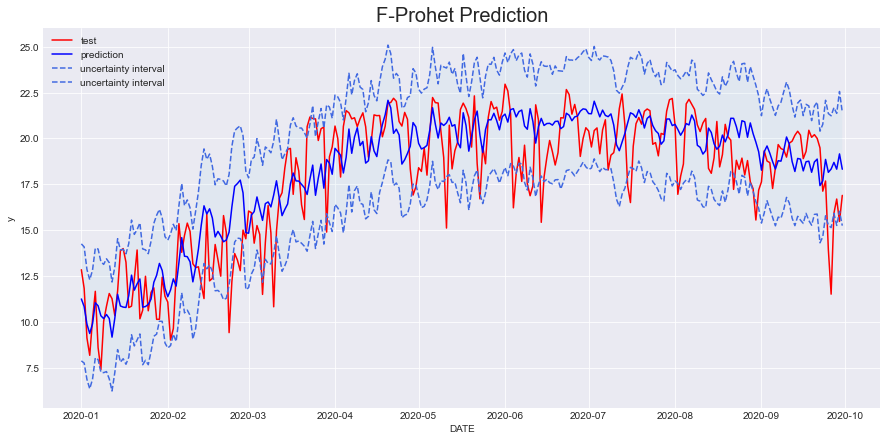

In [179]:
plt.figure(figsize=(15,7))
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.plot(test['ds'], forecast['yhat'].values, c="blue", label="prediction")
plt.plot(test['ds'], forecast['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(test['ds'], forecast['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
ax.fill_between(test['ds'],  forecast['yhat_lower'], forecast['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.title('F-Prohet Prediction', fontsize=20)
plt.ylabel('y')
plt.xlabel('DATE')
plt.legend()
plt.show();

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))

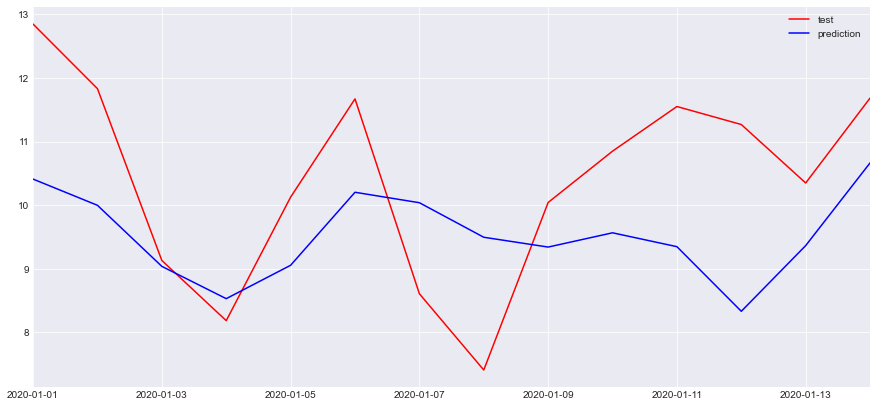

In [180]:
plt.figure(figsize=(15,7))
plt.plot(prediction_df['ds'], test.iloc[:14].loc[:,'y'].values, c="red", label="test")
plt.plot(prediction_df['ds'], prediction_df['yhat'].values, c="blue", label="prediction")

ax = plt.gca()

plt.legend()
ax.autoscale(enable=True, axis='x', tight=True)

plt.show();

In [181]:
from fbprophet.plot import plot_plotly, plot_components_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(model, forecast)  # This returns a plotly Figure
py.iplot(fig)

In [182]:
plot_components_plotly(model, forecast)

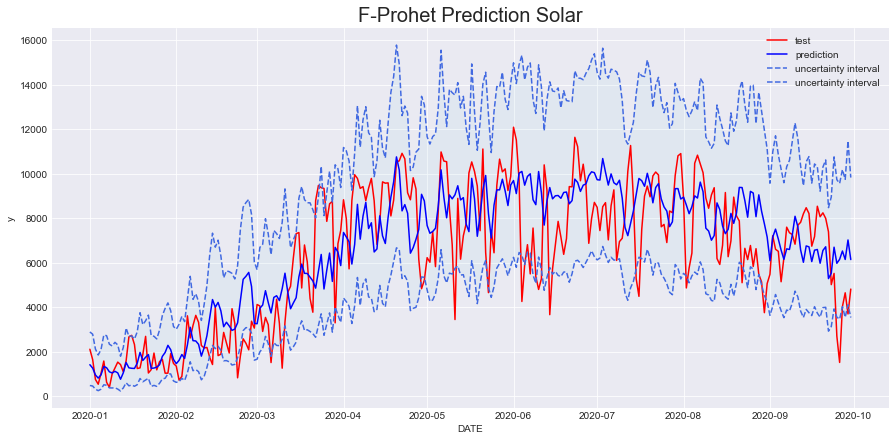

In [183]:
train.y = train.y**3
test.y = test.y**3
forecast.yhat = forecast.yhat**3
forecast.yhat_lower = forecast.yhat_lower**3
forecast.yhat_upper = forecast.yhat_upper**3


plt.figure(figsize=(15,7))
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.plot(test['ds'], forecast['yhat'].values, c="blue", label="prediction")
plt.plot(test['ds'], forecast['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(test['ds'], forecast['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
ax.fill_between(test['ds'],  forecast['yhat_lower'], forecast['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.title('F-Prohet Prediction Solar', fontsize=20)
plt.ylabel('y')
plt.xlabel('DATE')
plt.legend()
plt.show();

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))

In [ ]:
# Redo the cubed root on the prediction function
prediction_df.yhat = prediction_df.yhat**3
prediction_df.yhat_lower = prediction_df.yhat_lower**3
prediction_df.yhat_upper = prediction_df.yhat_upper**3

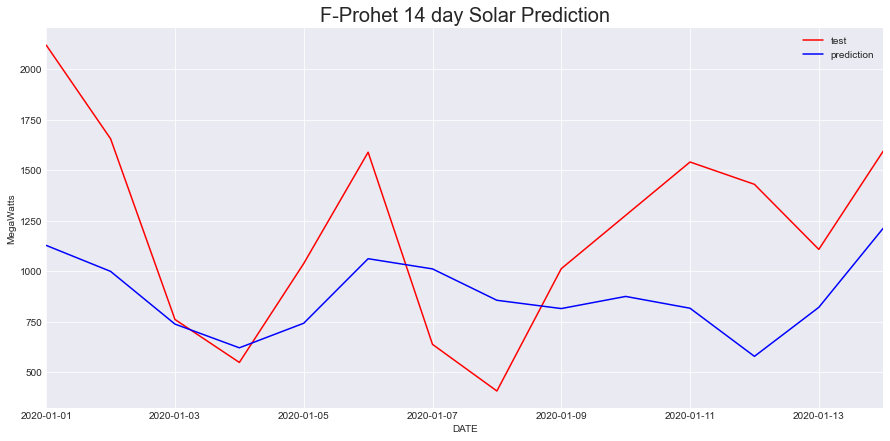

In [185]:
plt.figure(figsize=(15,7))
plt.plot(prediction_df['ds'], test.iloc[:14].loc[:,'y'].values, c="red", label="test")
plt.plot(prediction_df['ds'], prediction_df['yhat'].values, c="blue", label="prediction")
ax = plt.gca()
plt.legend()
ax.autoscale(enable=True, axis='x', tight=True)
plt.title('F-Prohet 14 day Solar Prediction', fontsize=20)
plt.ylabel('MegaWatts')
plt.xlabel('DATE')
plt.show();

In [186]:
from sklearn.metrics import mean_absolute_error
print("MAE: ", mean_absolute_error(test['y'][:14], forecast['yhat'][:14]))

MAE:  333.36665540007476


In [187]:
from sklearn.metrics import mean_squared_error
from math import sqrt
print("RMSE: ", sqrt(mean_squared_error(test['y'][:14], forecast['yhat'][:14])))

RMSE:  415.7966218603646


These are the best numbers we have been able to receive so far. A mean absolute error of 333.4 means that we are on average off by 333 MW in terms of predicting the next 14 days against the test set. These numbers may seem large however if this model was applied to a much a smaller 

# WIND ENERGY - EDA 
Many of these steps are the same for the solar. 

In [195]:
# create a wind_power series
wind_power = energy_all['DE_wind_generation_actual']

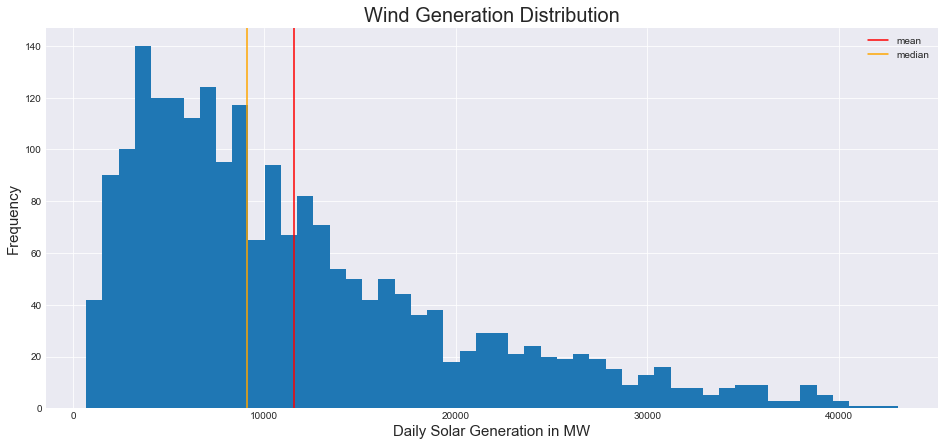

In [199]:
plt.figure()
plt.hist(wind_power, bins=50)
plt.title('Wind Generation Distribution', fontsize=20)
plt.ylabel('Frequency', fontsize=15)
plt.xlabel('Daily Solar Generation in MW',fontsize=15)
plt.axvline(wind_power.mean(), c='red', label ='mean')
plt.axvline(wind_power.median(), c='orange', label ='median')
plt.legend()

plt.show()

Heavily skewed right. The median and mean are very different.

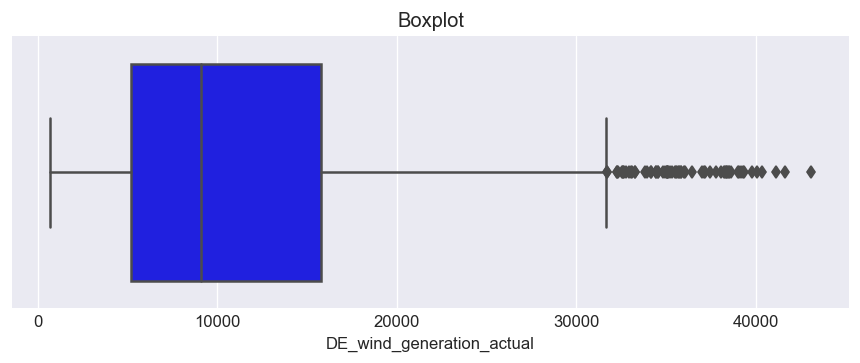

In [894]:
sns.boxplot(x=wind_power, color="blue")
plt.title('Boxplot')


plt.show()

It appears we have lots of outliers. Much different than solar power. 

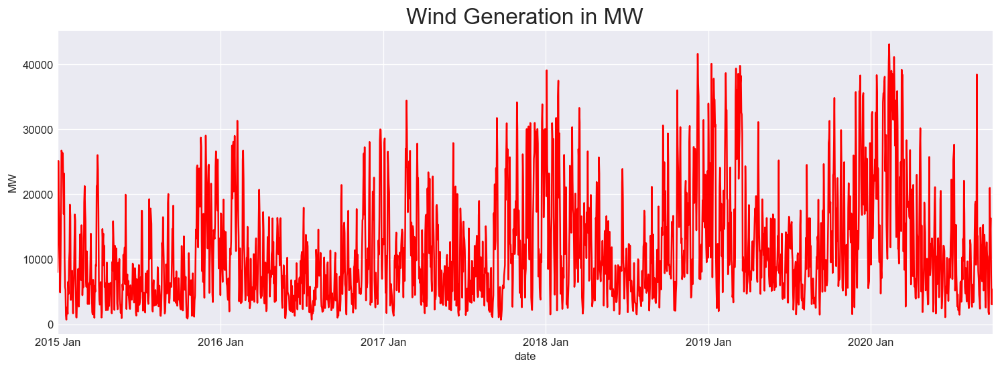

In [895]:
plt.figure(figsize=(15,5))
plt.plot(wind_power, c='red')
plt.title('Wind Generation in MW', fontsize=20)
plt.ylabel('MW')
plt.xlabel('date')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show()

This appears to have a lot more noise then solar. I see a little bit of trend going up 

In [896]:
# Check the decomposition of the wind power data
from statsmodels.api import tsa
decomposition = tsa.seasonal_decompose(wind_power, period=365, model='additive')

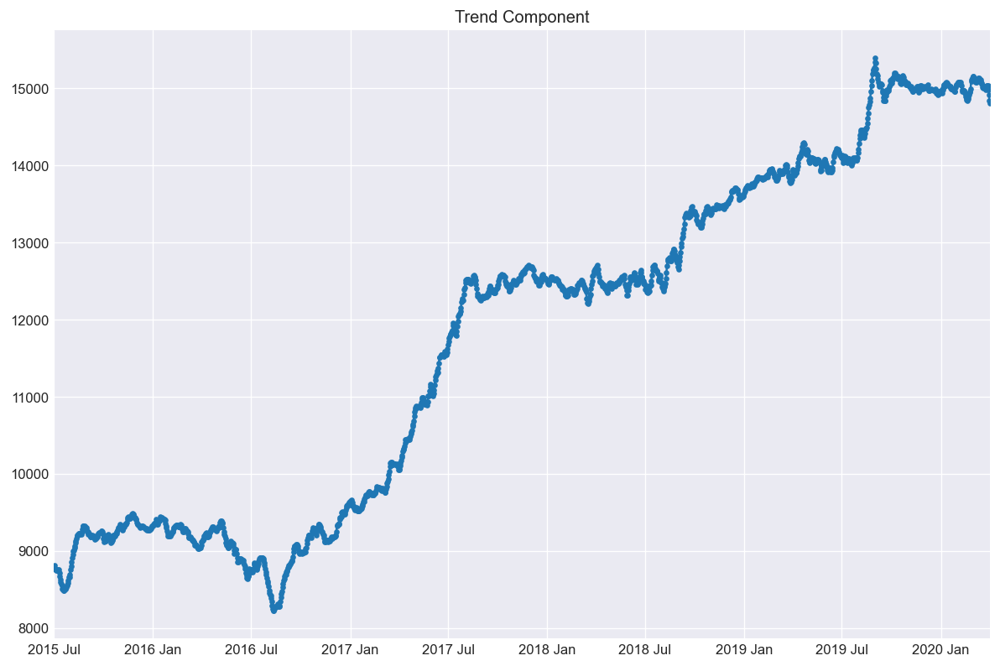

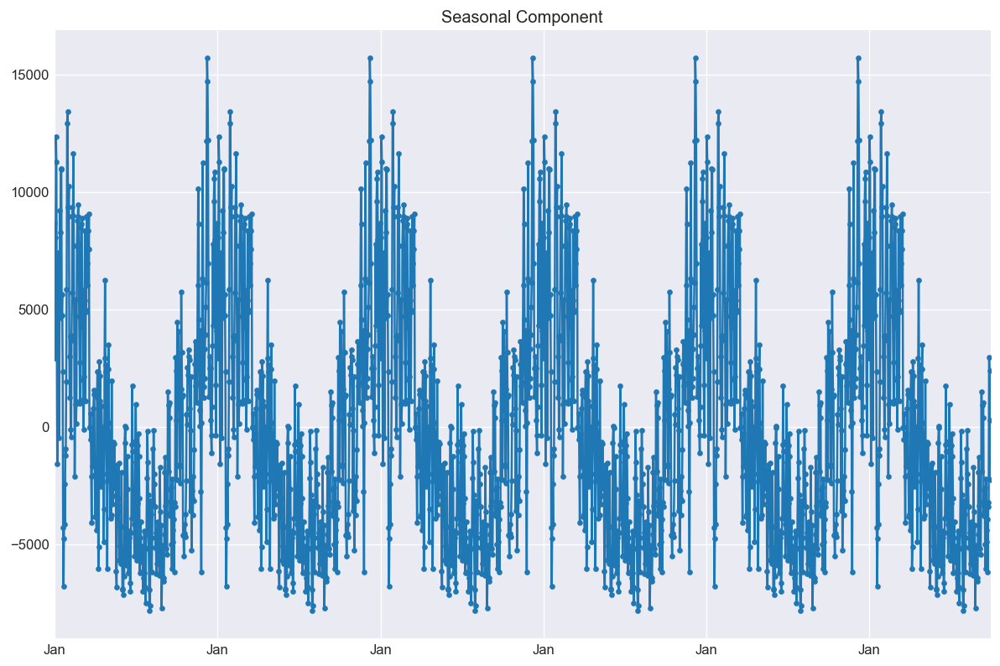

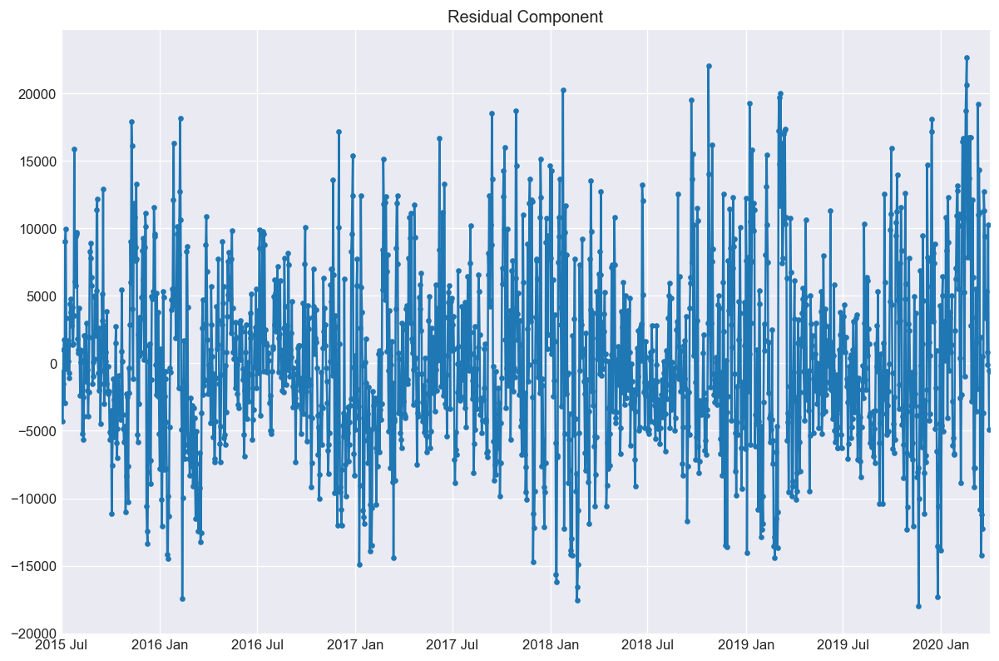

In [897]:
import matplotlib.dates as mdates
# Trend
plt.figure(figsize=(12,8))
plt.plot(decomposition.trend, marker='.')
plt.title('Trend Component')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show();

# Seasonal component
plt.figure(figsize=(12,8))
plt.plot(decomposition.seasonal, marker='.')
plt.title('Seasonal Component')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%b"))
plt.show();

# Residuals
plt.figure(figsize=(12,8))
plt.plot(decomposition.resid, marker='.')
plt.title('Residual Component')
ax = plt.gca()

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))
plt.show();

We see a clear rising linear trend which should be expected because Germany is increasing there Wind Farms across the country at a very fast pace. The seasonality is similar to solar except that the peak season is in January rather than summer.

# Stationary Check

We can use ADF-test to check stationary of the data.

$ H_0 : \text{Series has a unit root and hence is not stationary}  \quad vs. \quad H_1 : \text{ Series is stationary} $

In [898]:
s = adfuller(wind_power, regression='ct')
print('p-value:{}'.format(s[1]))

p-value:0.0009003538868081206


In [899]:
# Lets check the differencce 
s = adfuller(wind_power.diff().dropna(), regression='c')
print('p-value:{}'.format(s[1]))

p-value:3.205957720823452e-29


In [900]:
# KPSS test
from statsmodels.tsa.stattools import kpss
def kpss_test(wind_power, **kw):    
    statistic, p_value, n_lags, critical_values = kpss(solar_power, **kw)
    # Format Output
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'num lags: {n_lags}')
    print('Critial Values:')
    for key, value in critical_values.items():
        print(f'   {key} : {value}')
    print(f'Result: The series is {"not " if p_value < 0.05 else ""}stationary')

kpss_test(wind_power)

KPSS Statistic: 0.5210317781539585
p-value: 0.036929779695054385
num lags: 26
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is not stationary


In [901]:
# lets test it around the trend using ct, this will be a better test to use because of the actual trend of the data in the graphs above
kpss_test(wind_power, regression='ct')

KPSS Statistic: 0.09232306435028638
p-value: 0.1
num lags: 26
Critial Values:
   10% : 0.119
   5% : 0.146
   2.5% : 0.176
   1% : 0.216
Result: The series is stationary


### Conclusion about Stationary
The series passes the tests and appears to be stationary.

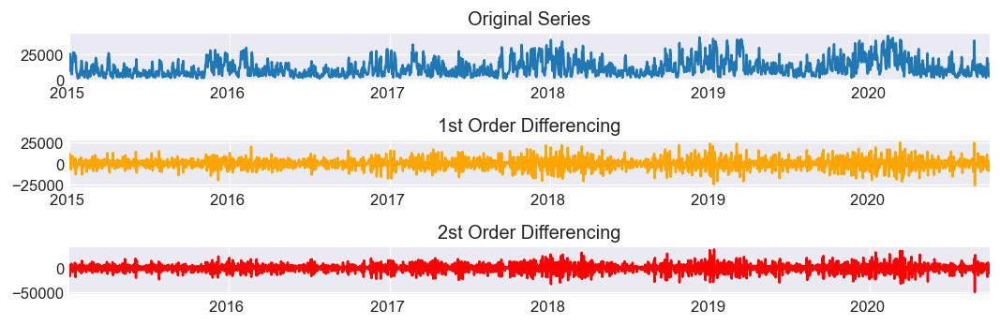

In [902]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

plt.subplots(3, 1)  

# orginal series
plt.subplot(3,1,1)
plt.plot(wind_power)
plt.title('Original Series')
ax = plt.gca()
ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y "))

plt.subplot(3,1,2)
plt.plot(wind_power.diff().dropna(), c='orange')
plt.title('1st Order Differencing')
ax = plt.gca()
ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y "))


plt.subplot(3,1,3)
plt.plot(wind_power.diff().diff().dropna(), c='red')
plt.title('2st Order Differencing')
ax = plt.gca()
ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y "))

plt.tight_layout()
plt.show()

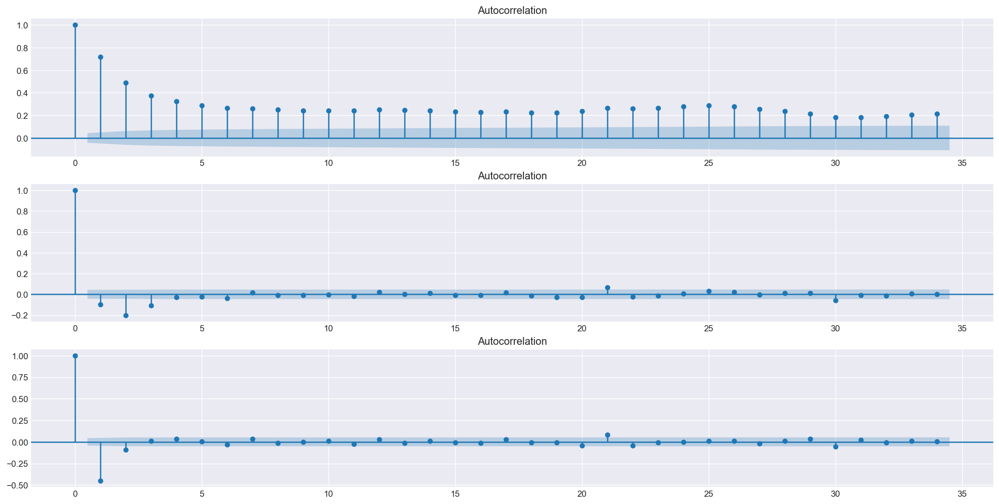

In [903]:
# Visualize the autocorrelation plots so that we can get a better idea of differencing.
fig,ax = plt.subplots(3,1,figsize=(20,10))
fig = plot_acf(wind_power, ax=ax[0])
fig = plot_acf(wind_power.diff().dropna(), ax=ax[1])
fig = plot_acf(wind_power.diff().diff().dropna(), ax=ax[2])

## Finding order of the AR term

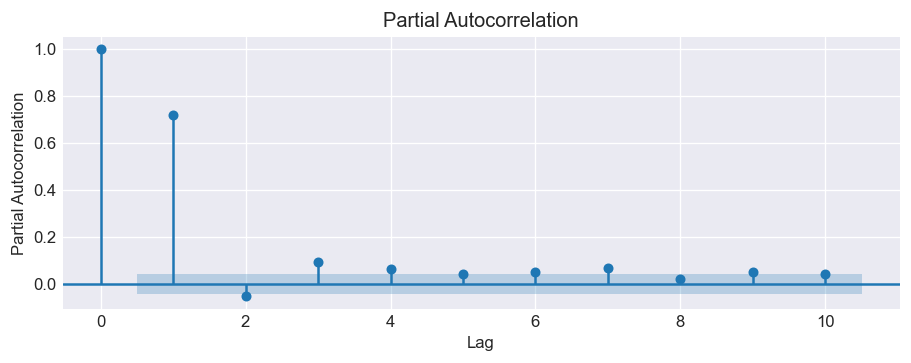

In [904]:
# Plot the PACF
from statsmodels.graphics.tsaplots import plot_pacf
plt.rcParams.update({'figure.figsize':(9,3),'figure.dpi':120})
                    
                    
plot_pacf(wind_power, lags=10)
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.show()

p=2 looks like a good starting point based on the graph

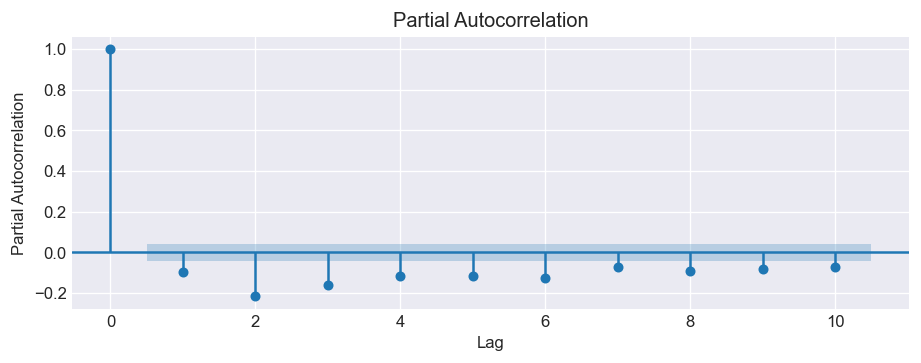

In [905]:
# lets check the differened one as well
plt.rcParams.update({'figure.figsize':(9,3),'figure.dpi':120})
                    
                    
plot_pacf(wind_power.diff().dropna(), lags=10)
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.show()

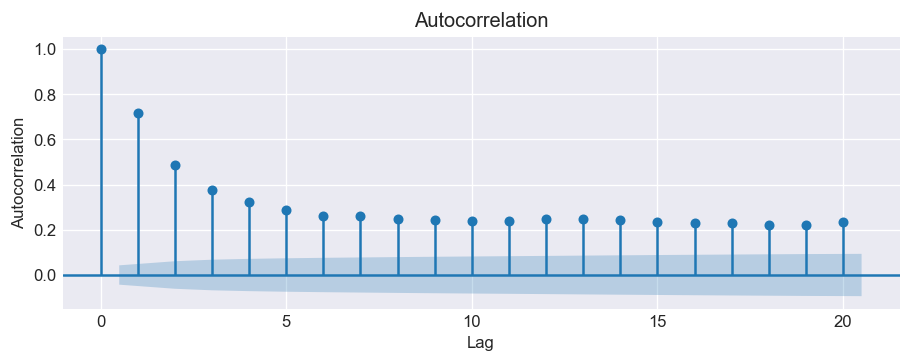

In [906]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(wind_power, lags=20)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

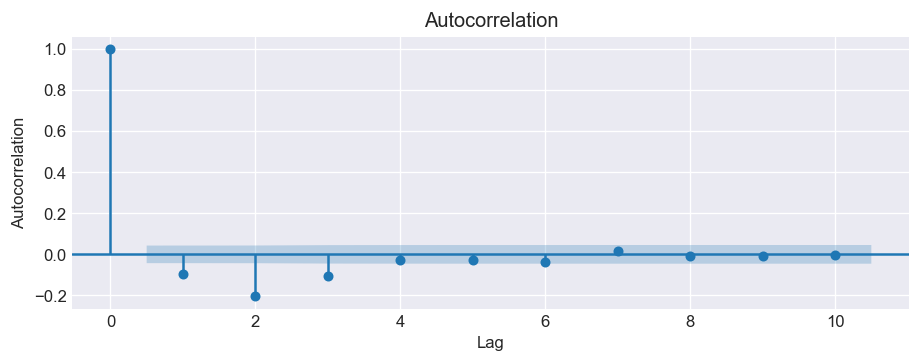

In [907]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(wind_power.diff().dropna(), lags=10)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

## Train and test

In [200]:
wind_power.shape

(2101,)

In [201]:
test_number = 274
train_w = wind_power[:-test_number]
test_w = wind_power[-test_number:]

In [202]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model_s = SARIMAX(train_w, order=(3,0,5), seasonal_order=(3,0,5,12),
                enforce_stationarity=False, 
                enforce_invertibility=False,
                trend="t") # order of _ for AR, 1 differentiation, and _ for MA
model_fit_s = model_s.fit(maxiter=2000)

print('Coefficients: %s' % model_fit_s.params)

Coefficients: drift       5.733320e-02
ar.L1       1.429869e+00
ar.L2      -4.375072e-01
ar.L3       4.024762e-03
ma.L1      -7.092334e-01
ma.L2      -1.966961e-01
ma.L3      -3.469349e-02
ma.L4       2.977026e-02
ma.L5      -3.923072e-02
ar.S.L12   -5.363811e-01
ar.S.L24    1.010090e-02
ar.S.L36    9.755478e-02
ma.S.L12    5.455394e-01
ma.S.L24    1.895938e-02
ma.S.L36   -3.945792e-02
ma.S.L48    2.156790e-02
ma.S.L60    4.265163e-02
sigma2      3.146517e+07
dtype: float64


RMSE:  8855.61977648926


NameError: name 'p' is not defined

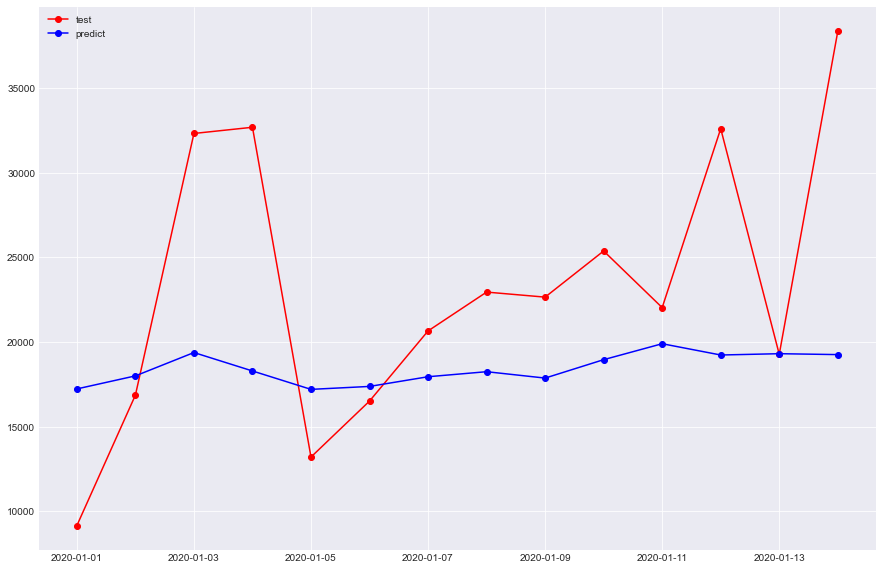

In [203]:
from sklearn.metrics import mean_squared_error
from math import sqrt

predictions = model_fit_s.predict(start=len(train_w), end=len(train_w)+len(test_w)-1, typ="levels", index= test_w.index)

print("RMSE: ", sqrt(mean_squared_error(test_w[:14], predictions[:14])))
plt.figure(figsize=(15,10))
plt.plot(test_w[:14], c="red", label="test", marker='o')
plt.plot(predictions[:14], c="blue", label="predict", marker='o')
plt.legend()
plt.show();

In [ ]:
from sklearn.metrics import mean_absolute_error
print("MAE: ", mean_absolute_error(test_w[:14], predictions[:14]))

In [ ]:
# make prediction
predictions = model_fit_s.predict(start=len(train_w), end=len(train_w)+len(test_w)-1, typ="levels", index=test_w.index)

fig = plt.figure()
plt.plot(test_w, c="red", label="test", marker='.')
plt.plot(predictions, c="blue", label="predict", marker='.')
plt.legend()
fig.autofmt_xdate()
plt.show();

In [ ]:
best_MAE = float('inf')

for p in range(1,10):
    for d in range(0,4):
        for q in range(1,10):
            
            print(f"Trying values of {(p,d,q)}",end = "\r")
            
            model = SARIMAX(train_w,order = (p,d,q),
                           enforce_stationary = False,
                           enforce_invertibility = False,
                           trend = "t")
            
            model_fit = model.fit(maxiter = 2000)
            
            predictions = model_fit.predict(start=len(train_w),end = len(train_w) + len(test_w) - 1,typ="levels", index=test_s.index)
            
            current_MAE = mean_absolute_error(test_w[:14],predictions[:14])
            
            if (best_MAE > current_MAE):
                best_MAE = current_MAE
                print(f"Found new best MAE of {best_MAE} with values {(p,d,q)}")

# F-Prophet

In [978]:
# the same steps need to be taken as we did with solar power.
dfw = pd.DataFrame(wind_power)
dfw

,DE_wind_generation_actual
utc_timestamp,
2014-12-31 00:00:00+00:00,8000.000000
2015-01-01 00:00:00+00:00,13548.541667
2015-01-02 00:00:00+00:00,25148.083333
2015-01-03 00:00:00+00:00,19289.791667
2015-01-04 00:00:00+00:00,16042.625000
...,...
2020-09-26 00:00:00+00:00,16333.916667
2020-09-27 00:00:00+00:00,7771.750000
2020-09-28 00:00:00+00:00,3083.833333


In [979]:
dfw['ds'] = wind_power.index


In [980]:
dfw

,DE_wind_generation_actual,ds
utc_timestamp,,
2014-12-31 00:00:00+00:00,8000.000000,2014-12-31 00:00:00+00:00
2015-01-01 00:00:00+00:00,13548.541667,2015-01-01 00:00:00+00:00
2015-01-02 00:00:00+00:00,25148.083333,2015-01-02 00:00:00+00:00
2015-01-03 00:00:00+00:00,19289.791667,2015-01-03 00:00:00+00:00
2015-01-04 00:00:00+00:00,16042.625000,2015-01-04 00:00:00+00:00
...,...,...
2020-09-26 00:00:00+00:00,16333.916667,2020-09-26 00:00:00+00:00
2020-09-27 00:00:00+00:00,7771.750000,2020-09-27 00:00:00+00:00
2020-09-28 00:00:00+00:00,3083.833333,2020-09-28 00:00:00+00:00


In [981]:
dfw['ds'] = pd.to_datetime(dfw['ds']).apply(lambda x: dt.datetime.strftime(x,'%Y-%m-%d'))
dfw['ds'] = pd.to_datetime(dfw['ds'])

In [982]:
dfw =dfw.reset_index(drop=True)
dfw

,DE_wind_generation_actual,ds
0,8000.000000,2014-12-31
1,13548.541667,2015-01-01
2,25148.083333,2015-01-02
3,19289.791667,2015-01-03
4,16042.625000,2015-01-04
...,...,...
2096,16333.916667,2020-09-26
2097,7771.750000,2020-09-27
2098,3083.833333,2020-09-28
2099,3050.583333,2020-09-29


In [983]:
dfw.rename(columns={'DE_wind_generation_actual': 'y'},inplace=True)

In [984]:
dfw.head()

,y,ds
0,8000.000000,2014-12-31
1,13548.541667,2015-01-01
2,25148.083333,2015-01-02
3,19289.791667,2015-01-03
4,16042.625000,2015-01-04


(2101, 2)


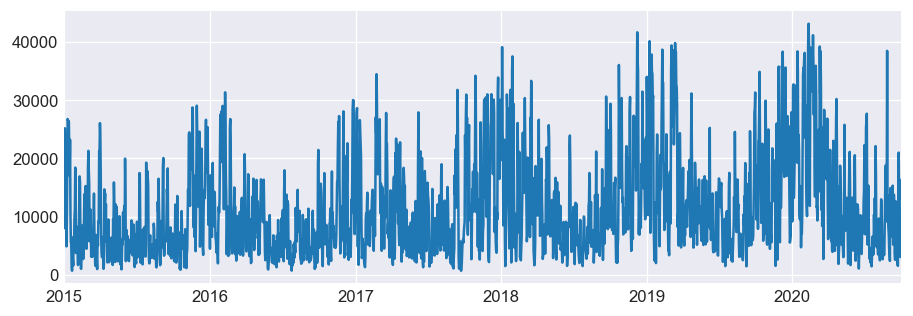

In [985]:
print(dfw.shape)
plt.figure()
plt.plot(dfw['ds'], dfw['y'])
plt.autoscale(enable=True, axis='x', tight=True)
plt.show();

In [986]:

train = dfw.loc[dfw.ds.dt.year < 2020,:]
test = dfw.loc[dfw.ds.dt.year >= 2020, :]

print(train.shape, test.shape)


(1827, 2) (274, 2)


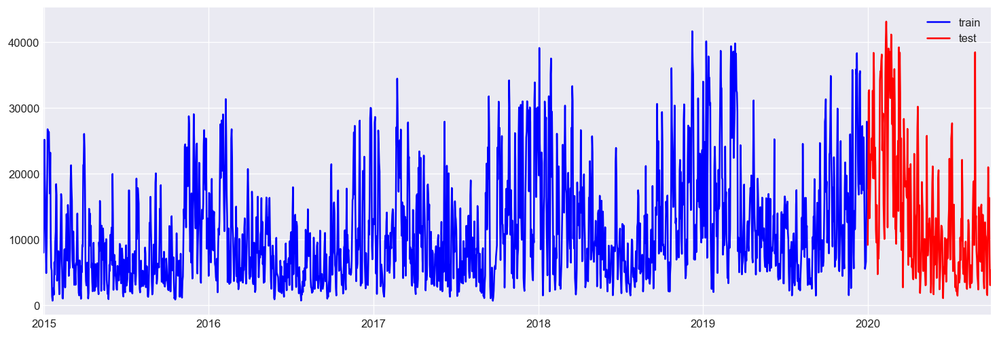

In [987]:
plt.figure(figsize=(15,5))
plt.plot(train['ds'],train['y'].values, c="blue", label="train")
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.autoscale(enable=True, axis='x', tight=True)
plt.legend()
plt.show();

In [988]:
model = Prophet(interval_width=0.95)
model.fit(train)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [989]:
# Use this prediction model to compare to the ARIMA Model 
prediction_df = model.predict(test[:14])
prediction_df = prediction_df[['ds','yhat', 'yhat_lower', 'yhat_upper']]

In [990]:

future = model.make_future_dataframe(periods=274, freq='D', include_history=False)

In [991]:
test.tail()

,y,ds
2096,16333.916667,2020-09-26
2097,7771.750000,2020-09-27
2098,3083.833333,2020-09-28
2099,3050.583333,2020-09-29
2100,5334.625000,2020-09-30


In [992]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2020-01-01,21546.836507,8265.666473,34754.403397
1,2020-01-02,21356.938019,7680.798300,34189.493455
2,2020-01-03,20638.370936,7322.893889,33920.228048
3,2020-01-04,21294.789639,8120.221565,35197.187000
4,2020-01-05,21217.504721,7357.925957,34037.991602


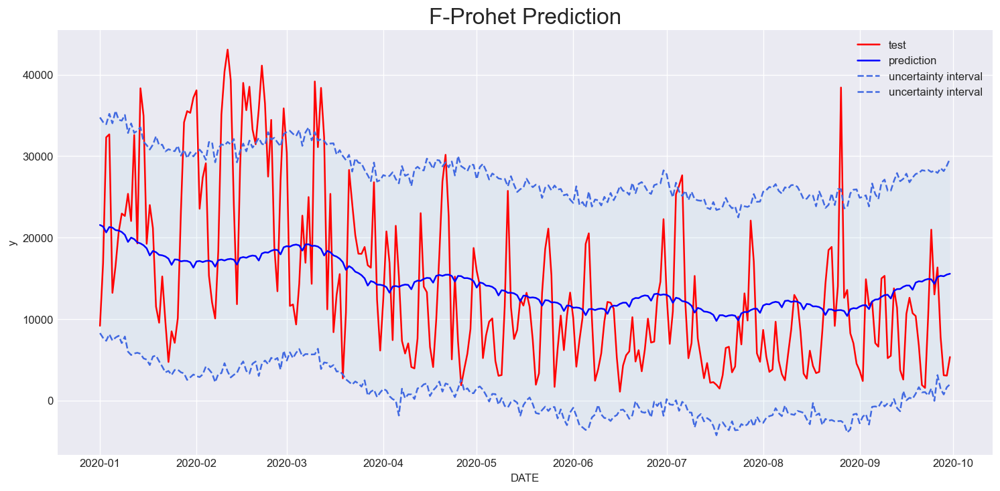

In [993]:
plt.figure(figsize=(15,7))
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.plot(test['ds'], forecast['yhat'].values, c="blue", label="prediction")
plt.plot(test['ds'], forecast['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(test['ds'], forecast['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
ax.fill_between(test['ds'],  forecast['yhat_lower'], forecast['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.title('F-Prohet Prediction', fontsize=20)
plt.ylabel('y')
plt.xlabel('DATE')
plt.legend()
plt.show();

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))

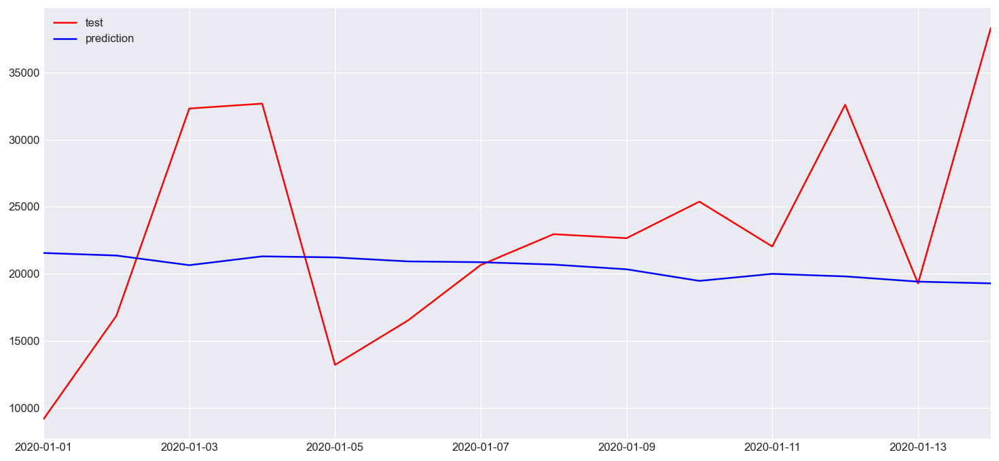

In [994]:
# Next 14 Days prediction visualization
plt.figure(figsize=(15,7))
plt.plot(prediction_df['ds'], test.iloc[:14].loc[:,'y'].values, c="red", label="test")
plt.plot(prediction_df['ds'], prediction_df['yhat'].values, c="blue", label="prediction")
#plt.plot(prediction_df['ds'], prediction_df['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
#plt.plot(prediction_df['ds'], prediction_df['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
#ax.fill_between(prediction_df['ds'],  prediction_df['yhat_lower'], prediction_df['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.legend()
ax.autoscale(enable=True, axis='x', tight=True)

plt.show();

In [995]:
from fbprophet.plot import plot_plotly, plot_components_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(model, forecast)  # This returns a plotly Figure
py.iplot(fig)

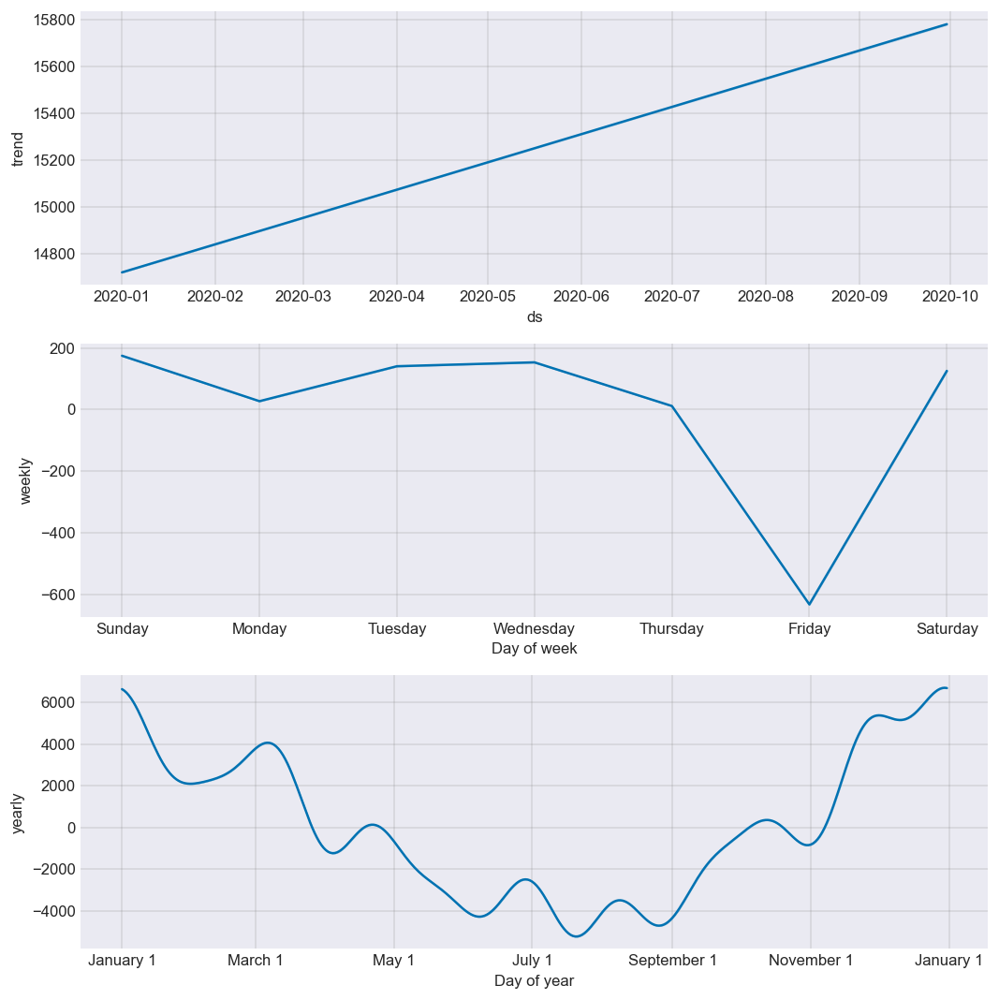

In [996]:
model.plot_components(forecast);

In [997]:
plot_components_plotly(model, forecast)

In [998]:
print("MAE: ", mean_absolute_error(test['y'][:14], forecast['yhat'][:14]))

MAE:  6933.638705555232


In [999]:
print("RMSE: ", sqrt(mean_squared_error(test['y'][:14], forecast['yhat'][:14])))

RMSE:  8861.564996602223


These results are not good. I see a lot of underfitting and I think we need to do more some transformation with our data 

### Improve Base Wind Model

(2101, 2)


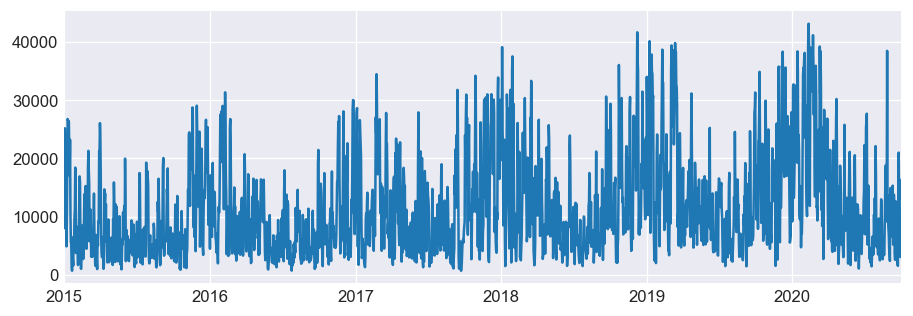

In [1001]:
print(dfw.shape)
plt.figure()
plt.plot(dfw['ds'], dfw['y'])
plt.autoscale(enable=True, axis='x', tight=True)
plt.show();

In [ ]:
dfw['cap'] = 44000 # for logistic growth 
dfw.cap = np.cbrt(dfw.cap) # for logistic growth you need to set a cap 
dfw.y = np.cbrt(dfw.y)

In [1003]:
train = dfw.loc[dfw.ds.dt.year < 2020,:]
test = dfw.loc[dfw.ds.dt.year >= 2020, :]

In [1004]:

model = Prophet( growth = 'logistic',
                interval_width=0.95, 
                changepoint_range=.6,
                daily_seasonality=False, 
                changepoint_prior_scale=0.05, 
                seasonality_prior_scale=11,
                yearly_seasonality=150,)
model.fit(train)

In [1005]:
# Use this prediction model to compare to the ARIMA Model 
prediction_df = model.predict(test[:14])
prediction_df = prediction_df[['ds','yhat', 'yhat_lower', 'yhat_upper']]

In [1006]:
future = model.make_future_dataframe(periods=274, freq='D', include_history=False)
future['cap'] = 50000
future.cap = np.cbrt(future.cap)
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2020-01-01,28.745324,20.384458,36.825318
1,2020-01-02,31.647658,23.483104,39.845236
2,2020-01-03,30.055161,21.961869,38.063418
3,2020-01-04,31.682266,23.597711,39.849172
4,2020-01-05,30.652783,21.927243,39.010150


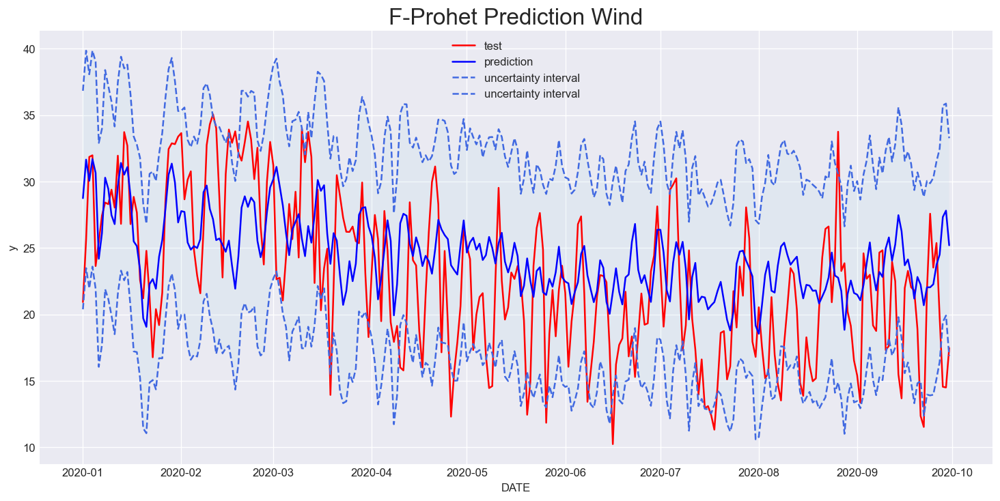

In [1007]:
plt.figure(figsize=(15,7))
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.plot(test['ds'], forecast['yhat'].values, c="blue", label="prediction")
plt.plot(test['ds'], forecast['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(test['ds'], forecast['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
ax.fill_between(test['ds'],  forecast['yhat_lower'], forecast['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.title('F-Prohet Prediction Wind', fontsize=20)
plt.ylabel('y')
plt.xlabel('DATE')

plt.legend()
plt.show();

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))

In [ ]:
# turn values back back to original 

train.y = train.y**3
test.y = test.y**3
forecast.yhat = forecast.yhat**3
forecast.yhat_lower = forecast.yhat_lower**3
forecast.yhat_upper = forecast.yhat_upper**3

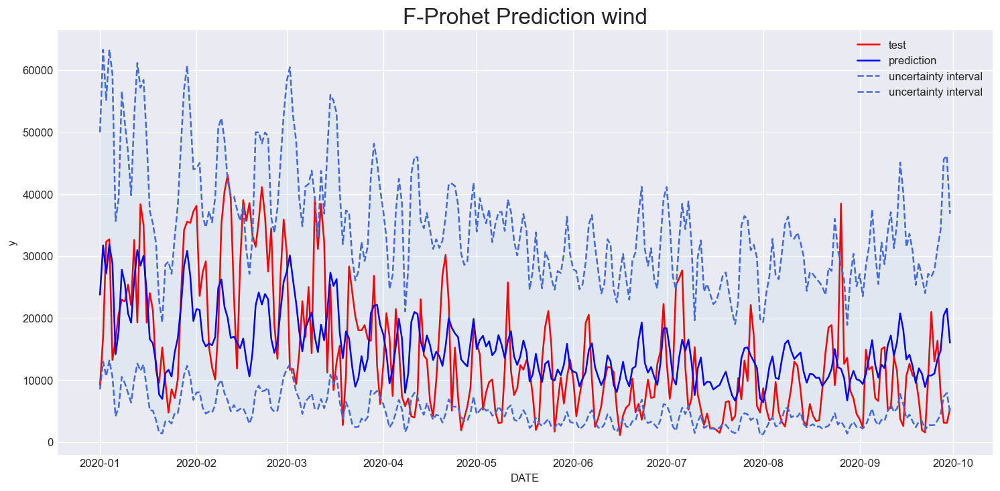

In [1008]:
plt.figure(figsize=(15,7))
plt.plot(test['ds'], test['y'].values, c="red", label="test")
plt.plot(test['ds'], forecast['yhat'].values, c="blue", label="prediction")
plt.plot(test['ds'], forecast['yhat_lower'].values, c="royalblue", label="uncertainty interval", linestyle='--')
plt.plot(test['ds'], forecast['yhat_upper'].values, c="royalblue", label="uncertainty interval", linestyle='--')
ax = plt.gca()
ax.fill_between(test['ds'],  forecast['yhat_lower'], forecast['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.title('F-Prohet Prediction wind', fontsize=20)
plt.ylabel('y')
plt.xlabel('DATE')
plt.legend()
plt.show();

ax.autoscale(enable=True, axis='x', tight=True)
ax.xaxis.set_major_formatter(DateFormatter("%Y %b"))

In [942]:
print("MAE: ", mean_absolute_error(test['y'][:14], forecast['yhat'][:14]))

MAE:  7103.842651301711


In [943]:
print("RMSE: ", sqrt(mean_squared_error(test['y'][:14], forecast['yhat'][:14])))

RMSE:  8678.116424708913


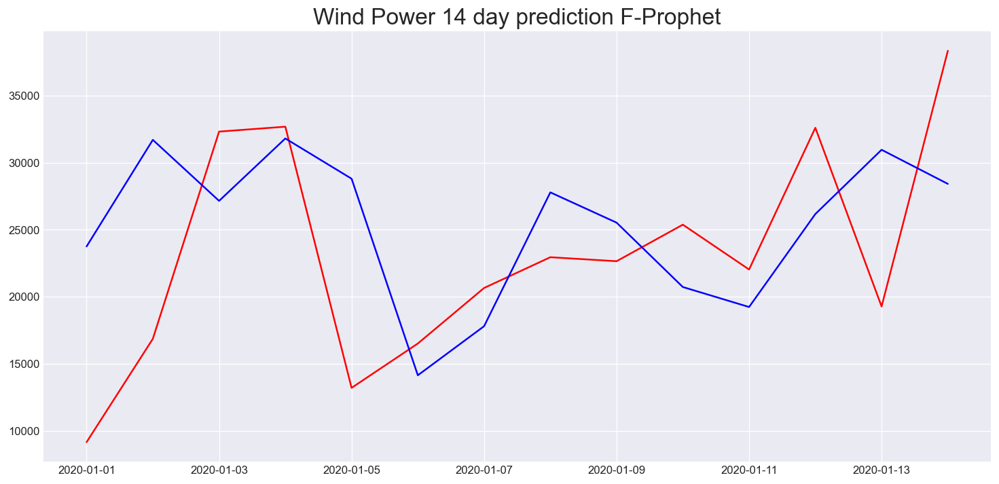

In [1014]:
plt.figure(figsize=(15,7))
plt.plot(test['ds'][:14], test['y'][:14].values, c="red", label="test")
plt.plot(test['ds'][:14], forecast['yhat'][:14].values, c="blue", label="prediction")
plt.title('Wind Power 14 day prediction F-Prophet', fontsize=20)
plt.legend()
plt.show()

This does not appear to look as bad as the numbers are telling us. I think more techniques need to be used in order to reduce the seasonality affect.